# UMAPs Neurips samples, NK cells

In this notebook UMAPs are generated from latent space, CLR transformed protein counts and RNA expression to compare the clustering results. 

Markers are collected from: 

Melsen, J. E., van Ostaijen-Ten Dam, M. M., Schoorl, D. J. A., Schol, P. J., van den Homberg, D. A. L., Lankester, A. C., Lugthart, G., & Schilham, M. W. (2022). Single-cell transcriptomics in bone marrow delineates CD56dimGranzymeK+ subset as intermediate stage in NK cell differentiation. Frontiers in immunology, 13, 1044398. https://doi.org/10.3389/fimmu.2022.1044398

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scvi
import scanpy as sc
import umap
import muon as mu

import warnings

warnings.filterwarnings('ignore')



# 1. Preparations

In [57]:
#Neurips

adata = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm_outer.h5ad')

In [58]:
adata

AnnData object with n_obs × n_vars = 80998 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [59]:
#Selecting only one sample
adata =adata[adata.obs['POOL'] == "s4d1"]

In [60]:
adata

View of AnnData object with n_obs × n_vars = 4885 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [61]:
#protein information

adata_prot=adata.obsm['protein_expression_clr_neurips']

In [62]:
#some proteins and genes have same names, here _prot added after protein names

adata_prot=adata_prot.rename(columns={'CD2': 'CD2_prot', 'CX3CR1': 'CX3CR1_prot', 'CD226':'CD226_prot', 'TIGIT':'TIGIT_prot', 'CD27':'CD27_prot', 'CD38': 'CD38_prot','CD34': 'CD34_prot', 'CD224': 'CD224_prot', 'CD7': 'CD7_prot', 'CD44': 'CD44_prot', 'CD34': 'CD34_prot','CD5': 'CD5_prot'})

In [63]:
#adding protein information to obs

a = adata.obs
b = adata_prot

df=pd.concat([a, b], axis=1)
adata.obs=df

In [64]:
adata

AnnData object with n_obs × n_vars = 4885 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47', 'CD48', 'CD40', 'CD154', 'CD52', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD16', 'CD25',

Here 3. different objects from the same adata object are created; latent, protein and RNA. UMAP neigbors are calculated differently for each object (either using latent space, CLR normalized protein, or RNA expression data and then visualized using UMAP projection. 

In [65]:
#Neurips, latent

adata_neurips_latent = adata.copy()

In [66]:
#Neurips, proteins

adata_neurips_prot = adata.copy()

In [67]:
#Neurips, RNA

adata_neurips_rna = adata.copy()

In [68]:
#RNA data is added to obs 

adata_neurips_rna.obsm['adata_x'] = adata_neurips_rna.to_df()

In [69]:
adata_neurips_rna

AnnData object with n_obs × n_vars = 4885 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47', 'CD48', 'CD40', 'CD154', 'CD52', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD16', 'CD25',

In [70]:
#Both NK cell types selected + one sample is selected

sample_latent = adata_neurips_latent[(adata_neurips_latent.obs['cell_type'] == "NK") | (adata_neurips_latent.obs['cell_type'] == "NK CD158e1+")]

In [71]:
#Both NK cell types selected  + one sample is selected

sample_prot = adata_neurips_prot[(adata_neurips_prot.obs['cell_type'] == "NK") | (adata_neurips_prot.obs['cell_type'] == "NK CD158e1+")]

In [72]:
#Both NK cell types selected  + one sample is selected

sample_rna = adata_neurips_rna[(adata_neurips_rna.obs['cell_type'] == "NK") | (adata_neurips_rna.obs['cell_type'] == "NK CD158e1+")]

## Markers

### 8 NK cell cluster were defined: #

1. Mature CD56dim NK cells (83% of all cells)
2. lymhphoid tissue-resident (lt) CXCR6+ NK cells (4%) 
3. CD34+ (progenitors?) (1.9%)
4. immature CD56bright NK cells (
5. non-cytotoxic innate lymphoid cells (ILCs)
6. proliferating NK cells
7. Mature CD56dim NK cells (3.4% of all cells)
8. CD56- and CD16+ NK cells with reduced effector function


### Markers: #

1. GZMK-, S100A4, S100A6, ACTB, ACTG1, CORO1A, PFN1. 
2. CCL3, CCL4, XCL1, GZMK, CD160, DUSP2, CXCR4, BTG1
3. Mainly defined by absence of CCL5, CD117+
4. SELL (CD62L), CD2, CD117, IL7R, high expression of KLRC1, CD56bright
5. Absence of NKG7, high expression of IL7R, high expression of FGFBP2, PRSS23
6. Upregulated cell cycle genes, high S100A4, S100A6, KLRC2. Upregulation of IL32, GZMH and GNLY, and downregulation of KLRC1, KLRB1 (CD161) and CD160
7. GZMK+, higher expression of SELL (CD62L) and lower expression of GZMB, PRF1 and PCGR3A (CD16) compared to cluster 1. Intermediate stage between CD56bright and CD56dim? 
8. Express NKG7 and FCGR3A, but had low expression of PRF1 and GZMB. CD56-, CD16+. 


- Generally, inhibitory KIRs more frequently expressed in terminally differentiated cells, but in this study were not in top5 DE genes. 
- When comparing to other datasets,  CD56- NK cells not found (probably donor specific). The CD34+ and lt-NK cells were barely detected in blood (likely bone-marrow resident). 
- New identified cluster 7, CD56dim GZMK+. Likely intermediate state between CD56bright and CD56dim
- pseudotime analysis of terminally differentiated cells : FGFBP2, PRF1,GZMB, GZMK. Shift from granzyme K to granzyme B during differentiation. 


- Latent = UMAP is generated from latent space
- Protein = UMAP is generated from CLR normalized protein counts
- RNA = UMAP is generated from normalized RNA expression data


In [73]:
#CD56bright

cd56bright_mels = ['NCAM1', 'KIT', 'SELL', 'CD2', 'IL7R', 'KLRC1']

cd56bright_mels_prot= ['CD56', 'CD62L', "CD2_prot", 'CD127']  #CD117 ab not used in this dataset

#Cluster 1 and 7 (CD56dim)

cd56dim_1_high= ['S100A4', 'S100A6', 'ACTB', 'ACTG1', 'CORO1A', 'PFN1']
cd56dim_1_low = ['GZMK']

cd56dim_7_high = ['GZMK', 'SELL'] #higher expression compared to cluster 1
cd56dim_7_low = ['GZMB', 'PRF1', 'FCGR3A', 'FGFBP2'] #lower expression compared to cluster 1
cd56dim_7_high_prot = ['CD62L']
cd56dim_7_low_prot =['CD16']

#Tissue resident NK

tr_mels= ['CCL3', 'CCL4', 'XCL1', 'GZMK', 'CD160', 'DUSP2', 'CXCR4', 'BTG1']


#ILC
ILC_mels_high = ['IL7R', 'KIT', 'FGFBP2', 'PRSS23'] 
ILC_mels_low = ['NKG7']

#Proliferating
prolif_high = ['S100A4', 'S100A6', 'KLRC2', 'IL32', 'GZMH', 'GNLY']
prolif_low = ['KLRC1', 'KLRB1']

#Reduced effector function

red_eff_high = ['NKG7', 'FCGR3A']
red_eff_low = ['PRF1', 'GZMB']

red_eff_high_prot = ['CD16']
red_eff_low_prot = ['CD56']

#Precursors

clust3_mels = ['CD34', 'KIT']
clust3_mels_prot = ['CD34_prot'] #CD117 not used in Neurips ab panel, CD34 not expressed

In [74]:
#calculating gene set scores, scores not calculated for proteins

#CD56bright
sc.tl.score_genes(sample_latent, cd56bright_mels, score_name = 'cd56bright_mels_score')
sc.tl.score_genes(sample_prot, cd56bright_mels, score_name = 'cd56bright_mels_score')
sc.tl.score_genes(sample_rna, cd56bright_mels, score_name = 'cd56bright_mels_score')

#Cluster 1
sc.tl.score_genes(sample_latent, cd56dim_1_high, score_name = 'cd56dim_1_high_score')
sc.tl.score_genes(sample_prot, cd56dim_1_high, score_name = 'cd56dim_1_high_score')
sc.tl.score_genes(sample_rna, cd56dim_1_high, score_name = 'cd56dim_1_high_score')
#only 1 gene in lowly expressed genes, so score not calculated

#Cluster 7
sc.tl.score_genes(sample_latent, cd56dim_7_high, score_name = 'cd56dim_7_high_score')
sc.tl.score_genes(sample_prot, cd56dim_7_high, score_name = 'cd56dim_7_high_score')
sc.tl.score_genes(sample_rna, cd56dim_7_high, score_name = 'cd56dim_7_high_score')

sc.tl.score_genes(sample_latent, cd56dim_7_low, score_name = 'cd56dim_7_low_score')
sc.tl.score_genes(sample_prot, cd56dim_7_low, score_name = 'cd56dim_7_low_score')
sc.tl.score_genes(sample_rna, cd56dim_7_low, score_name = 'cd56dim_7_low_score')


#Tissue resident NK
sc.tl.score_genes(sample_latent, tr_mels, score_name = 'tr_mels_score')
sc.tl.score_genes(sample_prot, tr_mels, score_name = 'tr_mels_score')
sc.tl.score_genes(sample_rna, tr_mels, score_name = 'tr_mels_score')

#ILC
sc.tl.score_genes(sample_latent, ILC_mels_high, score_name = 'ILC_mels_high_score')
sc.tl.score_genes(sample_prot, ILC_mels_high, score_name = 'ILC_mels_high_score')
sc.tl.score_genes(sample_rna, ILC_mels_high, score_name = 'ILC_mels_high_score')
#only 1 gene in lowly expressed genes, so score not calculated

#Proliferating
sc.tl.score_genes(sample_latent, prolif_high, score_name = 'prolif_high_score')
sc.tl.score_genes(sample_prot, prolif_high, score_name = 'prolif_high_score')
sc.tl.score_genes(sample_rna, prolif_high, score_name = 'prolif_high_score')

sc.tl.score_genes(sample_latent, prolif_low, score_name = 'prolif_low_score')
sc.tl.score_genes(sample_prot, prolif_low, score_name = 'prolif_low_score')
sc.tl.score_genes(sample_rna, prolif_low, score_name = 'prolif_low_score')

#Reduced effector function
sc.tl.score_genes(sample_latent, red_eff_high, score_name = 'red_eff_high_score')
sc.tl.score_genes(sample_prot, red_eff_high, score_name = 'red_eff_high_score')
sc.tl.score_genes(sample_rna, red_eff_high, score_name = 'red_eff_high_score')

sc.tl.score_genes(sample_latent, red_eff_low, score_name = 'red_eff_low_score')
sc.tl.score_genes(sample_prot, red_eff_low, score_name = 'red_eff_low_score')
sc.tl.score_genes(sample_rna, red_eff_low, score_name = 'red_eff_low_score')

#Precursors
#sc.tl.score_genes(sample_latent, clust3_mels, score_name = 'clust3_mels_score')
#sc.tl.score_genes(sample_prot, clust3_mels, score_name = 'clust3_mels_score')
#sc.tl.score_genes(sample_rna, clust3_mels, score_name = 'clust3_mels_score')


In [75]:
sample_latent

AnnData object with n_obs × n_vars = 665 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47', 'CD48', 'CD40', 'CD154', 'CD52', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD16', 'CD25', 

In [76]:
#PCA for RNA and protein

sc.pp.pca(sample_prot)
sc.pp.pca(sample_rna)

In [77]:
#Calculating neighbors for UMAPs

sc.pp.neighbors(sample_latent, use_rep="X_totalVI")   
sc.pp.neighbors(sample_prot, use_rep="protein_expression_clr_neurips") 
sc.pp.neighbors(sample_rna) 


sc.tl.umap(sample_latent)
sc.tl.umap(sample_prot)
sc.tl.umap(sample_rna)

## CD56bright

Latent


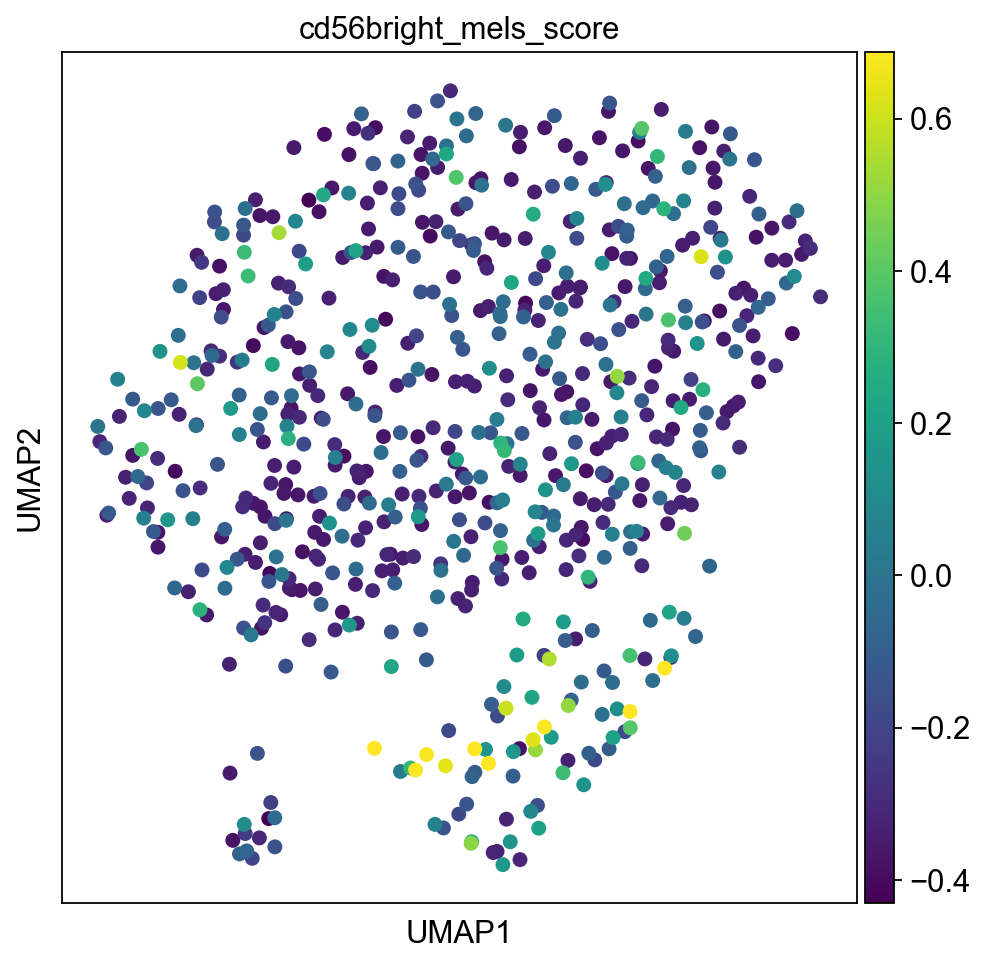

Protein


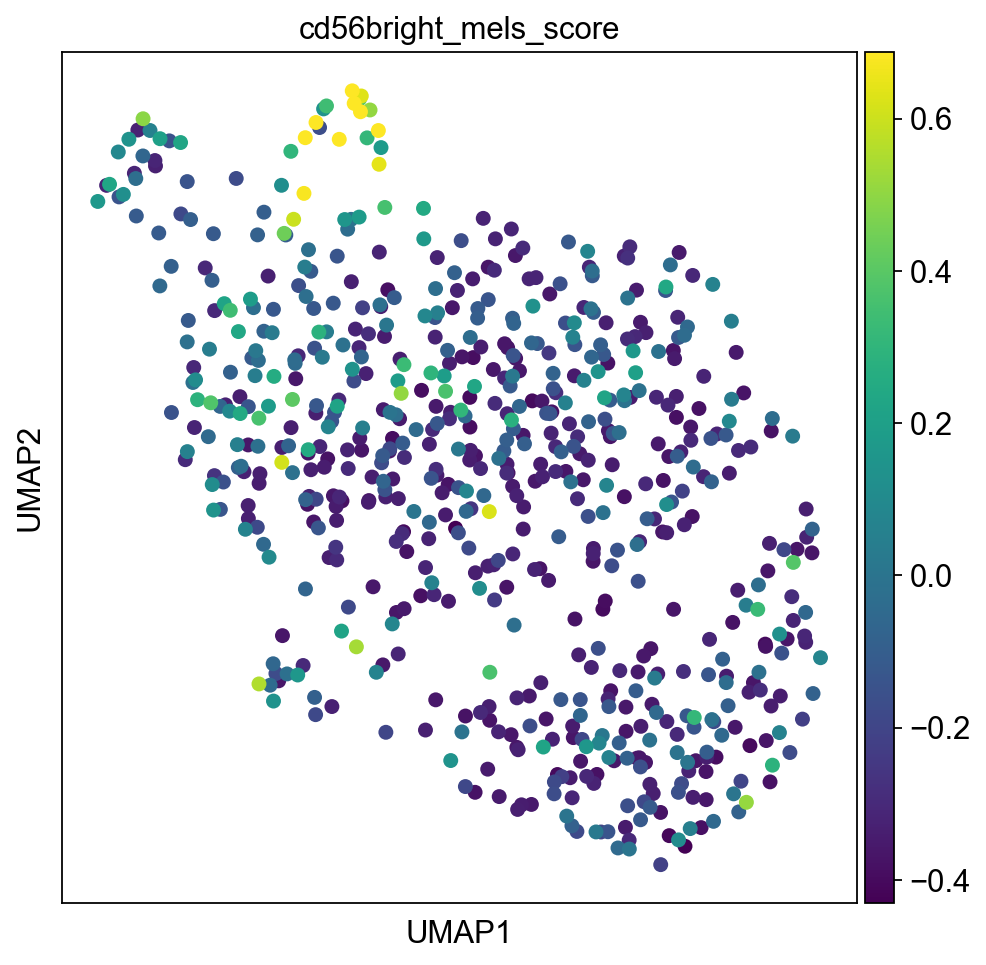

RNA


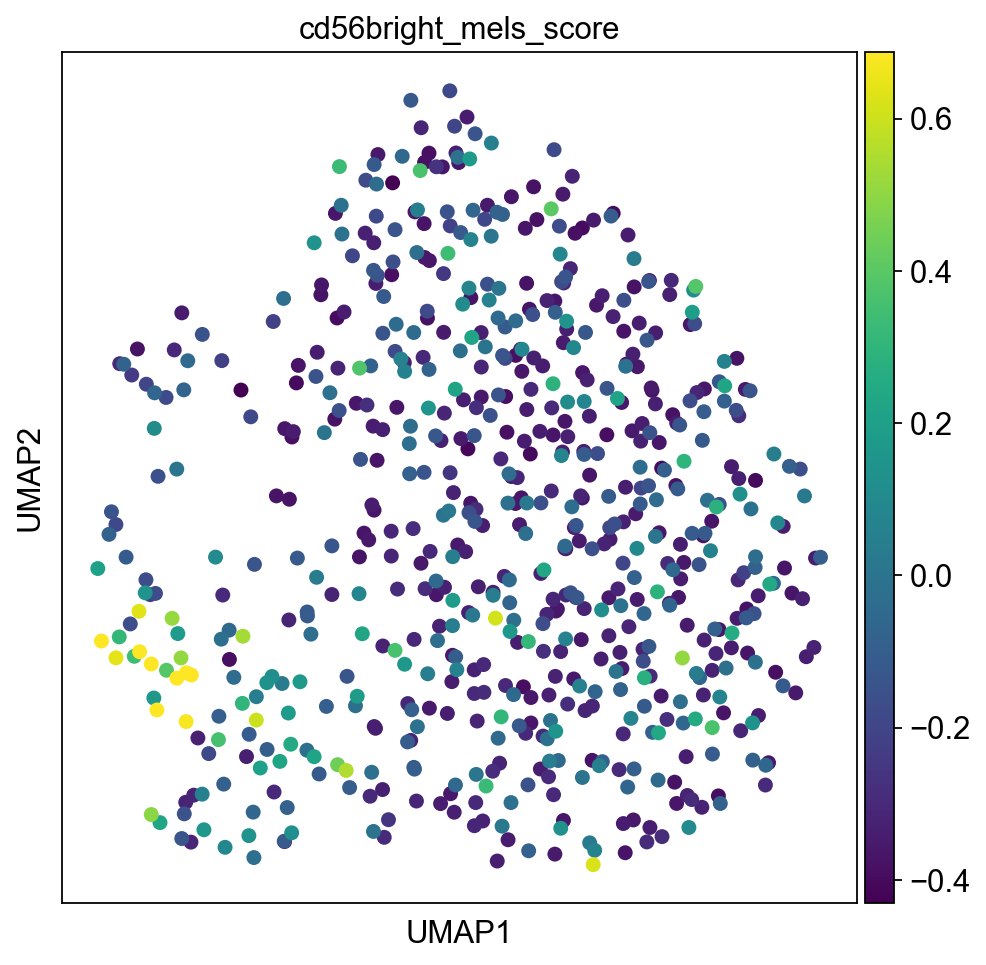

In [78]:
sc.set_figure_params(figsize=(7, 7))

print("Latent")
sc.pl.umap(sample_latent, color = ['cd56bright_mels_score'], vmax="p99", color_map = 'viridis', ncols = 3)
print("Protein")
sc.pl.umap(sample_prot, color = ['cd56bright_mels_score'], vmax="p99", color_map = 'viridis', ncols = 3)
print("RNA")
sc.pl.umap(sample_rna, color = ['cd56bright_mels_score'], vmax="p99", color_map = 'viridis', ncols = 3)


## Cluster 7, CD56dim 

In the paper, it was suggested that cluster 7 represents intermediate stage between CD56bright and CD56dim NK cells.

Latent


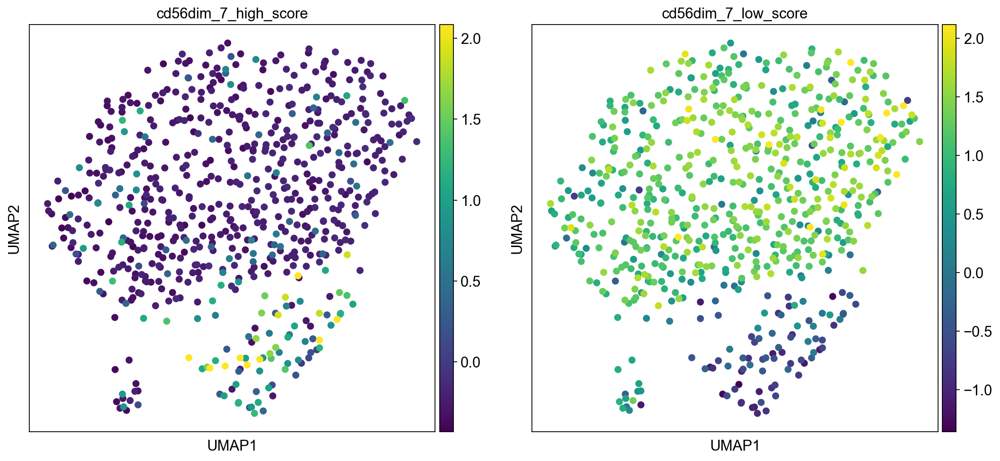

Protein


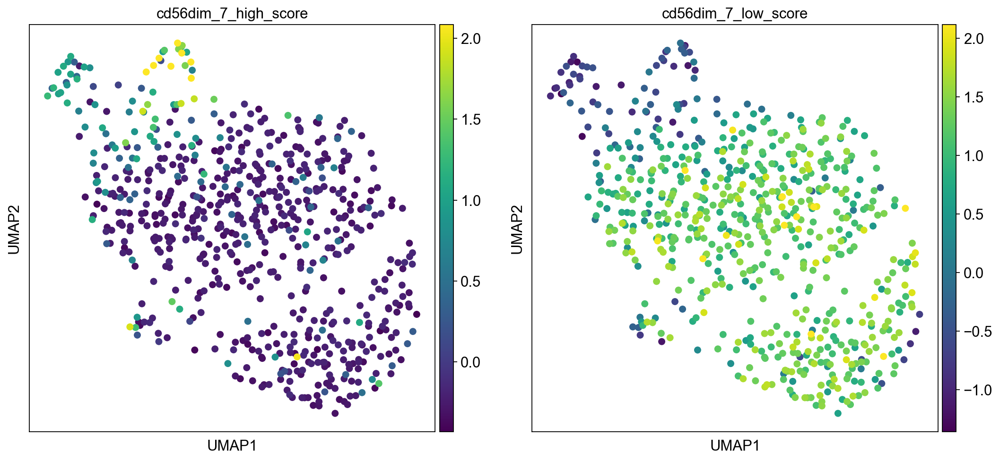

RNA


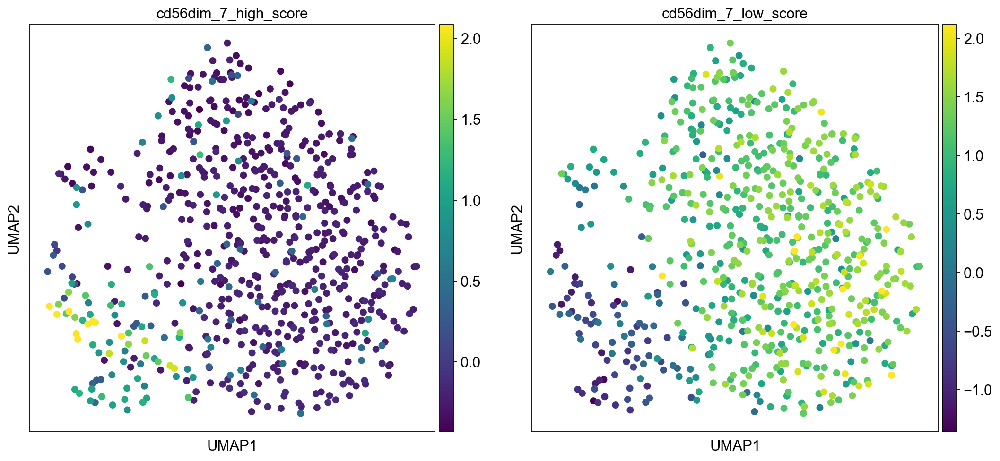

In [79]:
#highly and lowly expressed genes

sc.set_figure_params(figsize=(7, 7))

print("Latent")
sc.pl.umap(sample_latent, color = ['cd56dim_7_high_score', 'cd56dim_7_low_score'], vmax="p99", color_map = 'viridis', ncols = 3)
print("Protein")
sc.pl.umap(sample_prot, color = ['cd56dim_7_high_score', 'cd56dim_7_low_score'], vmax="p99", color_map = 'viridis', ncols = 3)
print("RNA")
sc.pl.umap(sample_rna, color = ['cd56dim_7_high_score', 'cd56dim_7_low_score'], vmax="p99", color_map = 'viridis', ncols = 3)



## Cluster 1, CD56dim

Latent


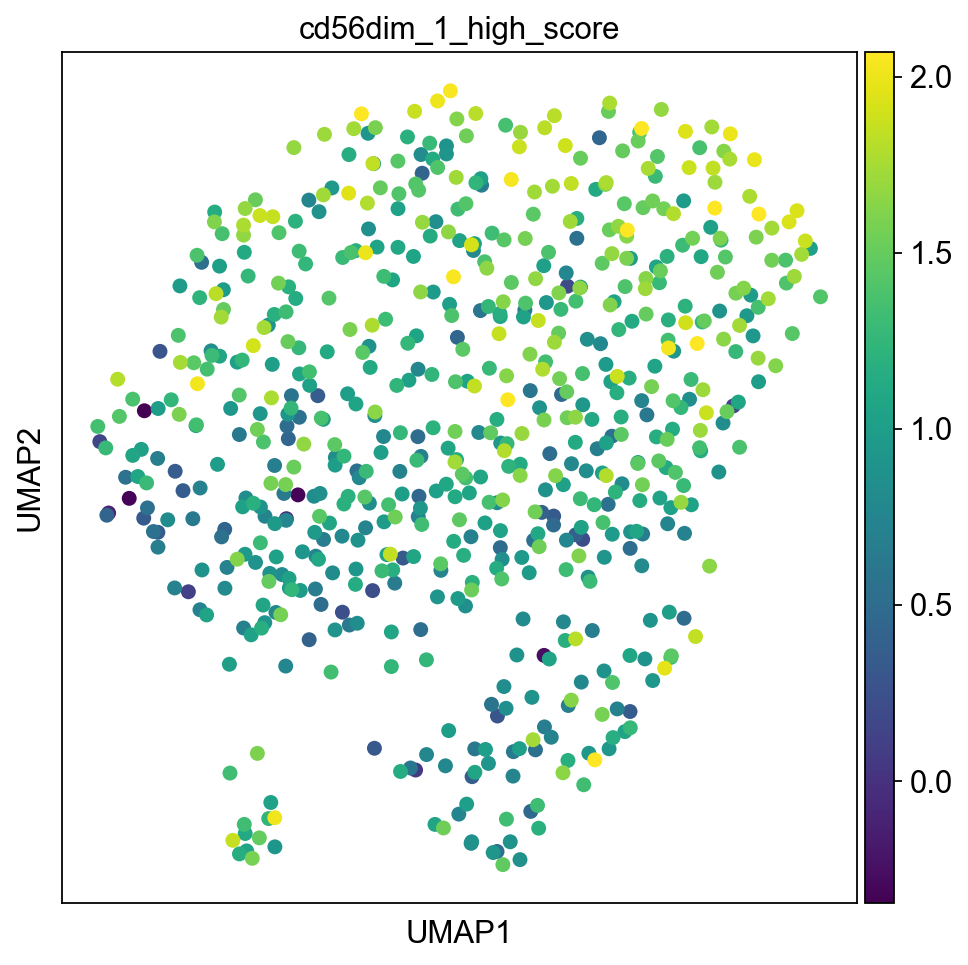

Protein


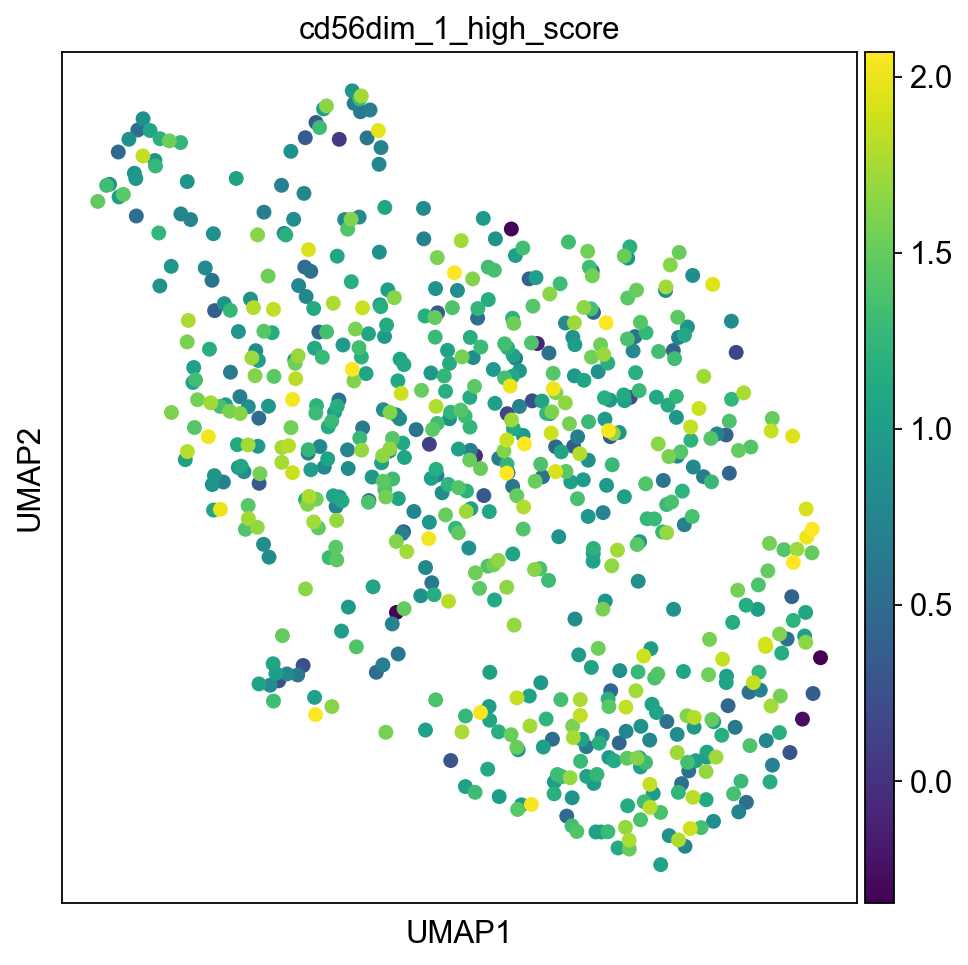

RNA


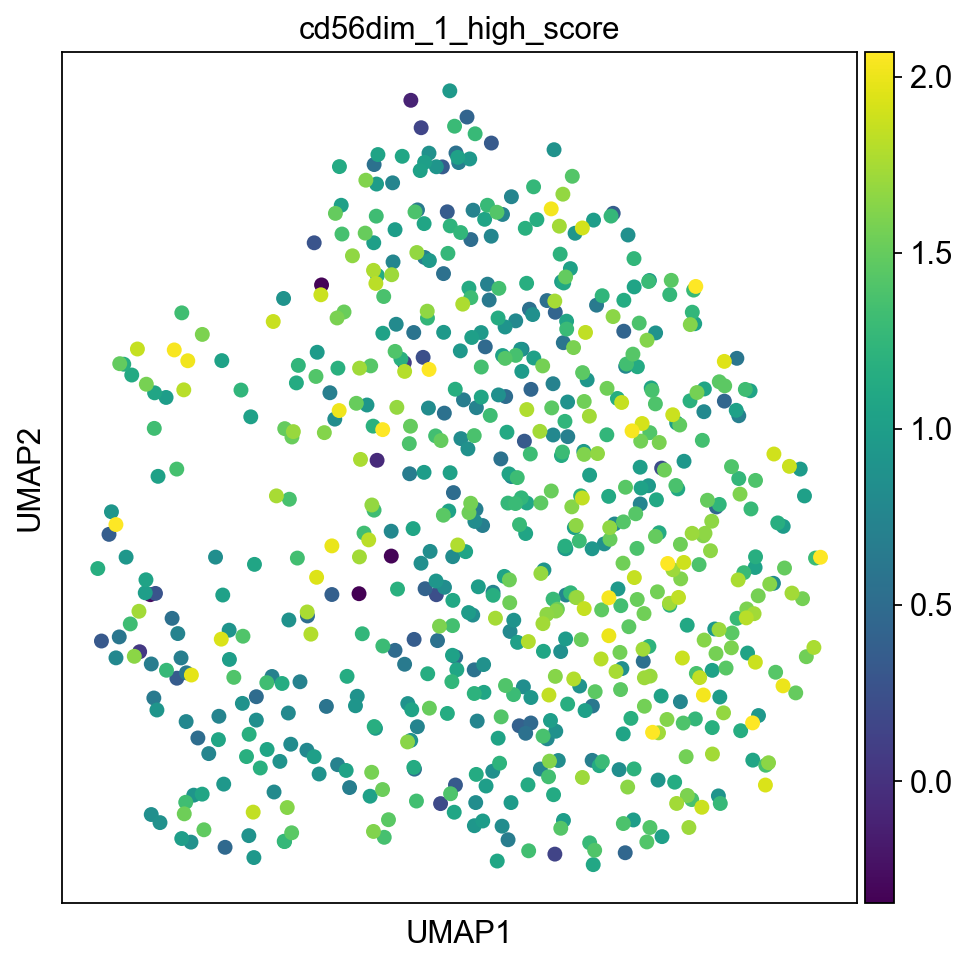

In [80]:
#Higly expressed

sc.set_figure_params(figsize=(7, 7))

print("Latent")
sc.pl.umap(sample_latent, color = ['cd56dim_1_high_score'], vmax="p99", color_map = 'viridis', ncols = 3)
print("Protein")
sc.pl.umap(sample_prot, color = ['cd56dim_1_high_score'], vmax="p99", color_map = 'viridis', ncols = 3)
print("RNA")
sc.pl.umap(sample_rna, color = ['cd56dim_1_high_score'], vmax="p99",  color_map = 'viridis', ncols = 3)


## Tissue resident NK cells

Latent


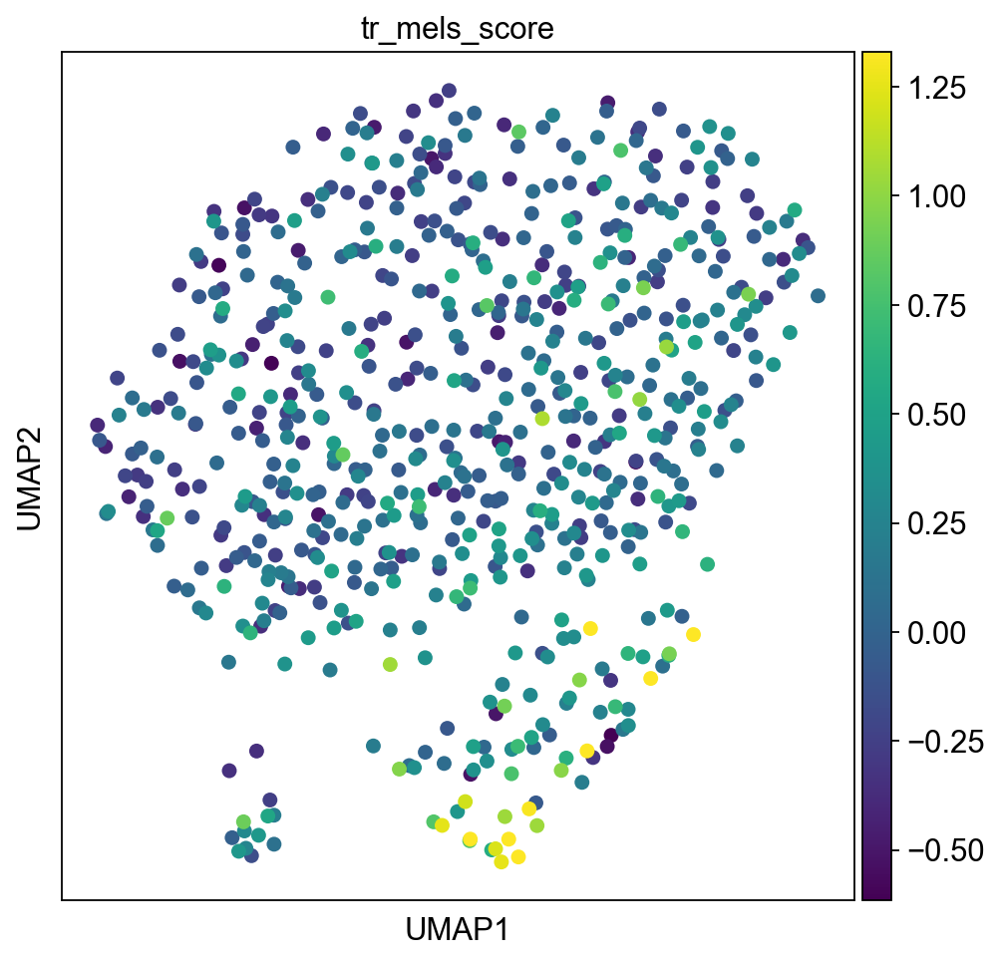

Protein


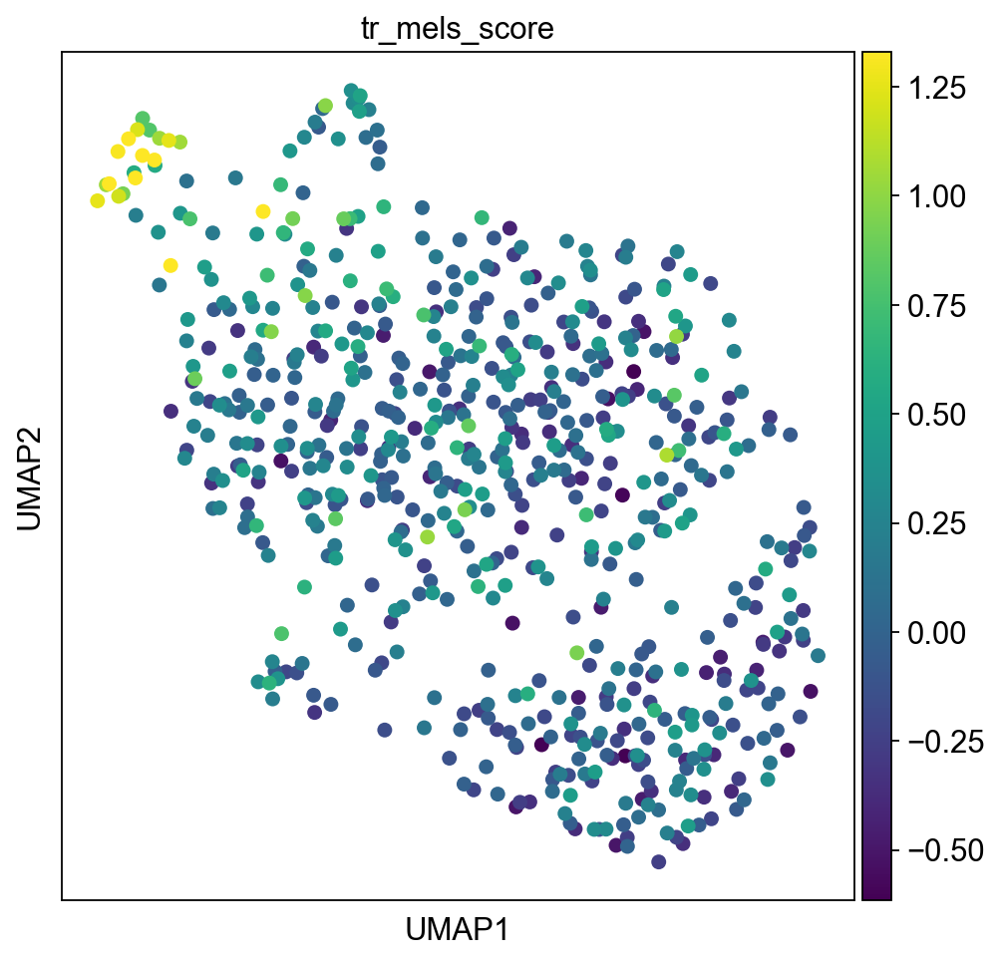

RNA


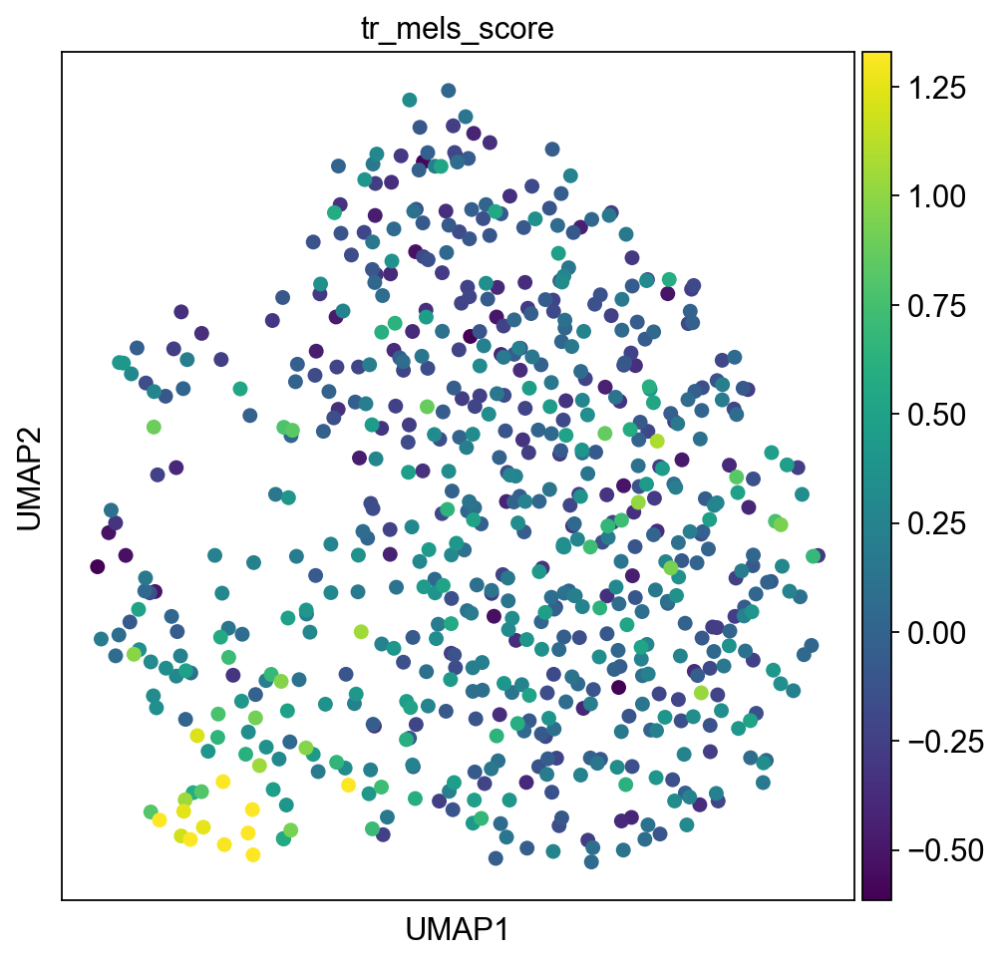

In [81]:
#Higly expressed

sc.set_figure_params(figsize=(7, 7))

print("Latent")
sc.pl.umap(sample_latent, color = ['tr_mels_score'], vmax="p99", color_map = 'viridis', ncols = 3)
print("Protein")
sc.pl.umap(sample_prot, color = ['tr_mels_score'], vmax="p99", color_map = 'viridis', ncols = 3)
print("RNA")
sc.pl.umap(sample_rna, color = ['tr_mels_score'], vmax="p99", color_map = 'viridis', ncols = 3)



## Proliferating NK

Latent


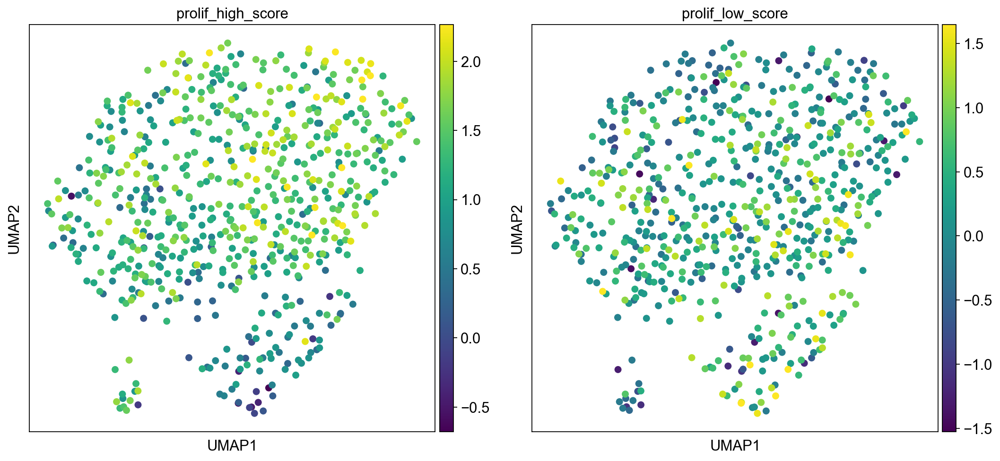

Protein


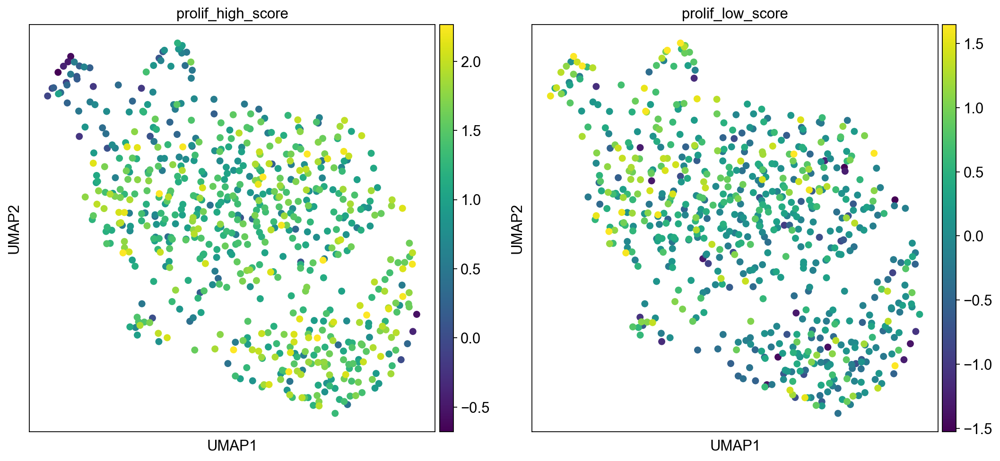

RNA


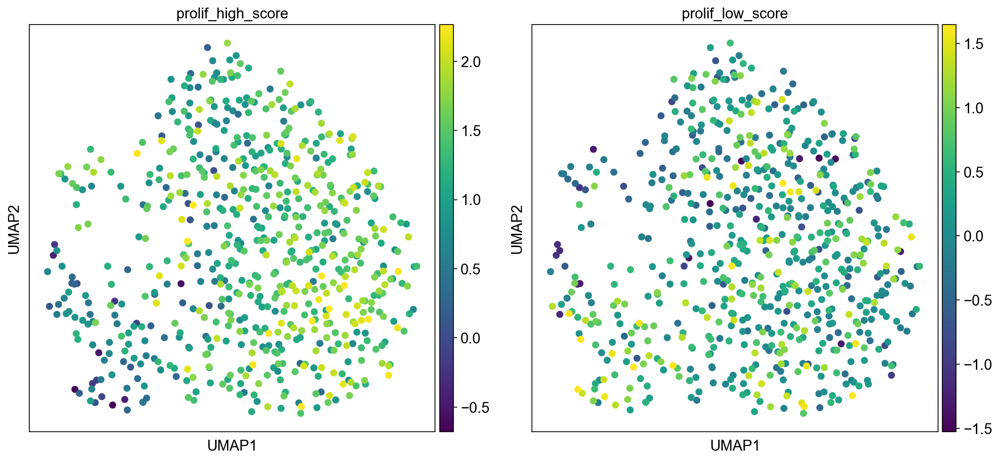

In [82]:
#highly and lowly expressed genes

sc.set_figure_params(figsize=(7, 7))

print("Latent")
sc.pl.umap(sample_latent, color = ['prolif_high_score', 'prolif_low_score'], vmax="p99", color_map = 'viridis', ncols = 3)
print("Protein")
sc.pl.umap(sample_prot, color = ['prolif_high_score', 'prolif_low_score'], vmax="p99", color_map = 'viridis', ncols = 3)
print("RNA")
sc.pl.umap(sample_rna, color = ['prolif_high_score', 'prolif_low_score'], vmax="p99", color_map = 'viridis', ncols = 3)


## NKs with reduced effector function

Latent


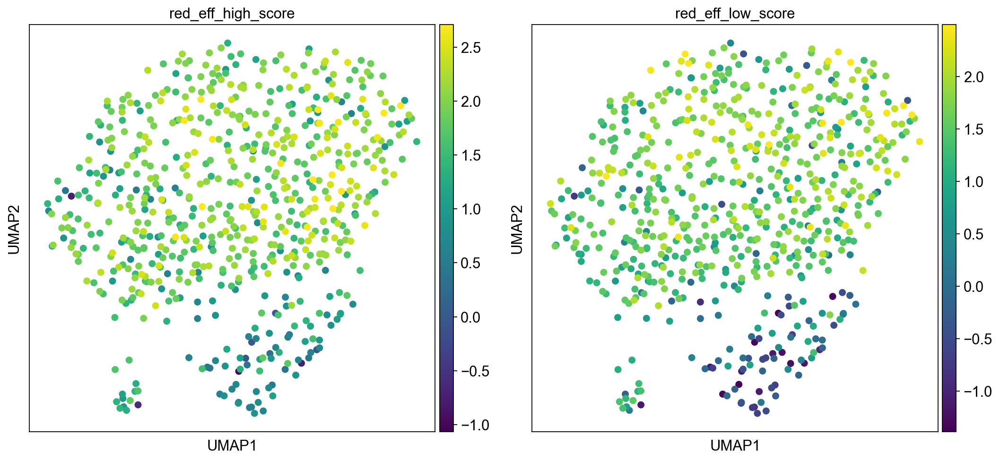

Protein


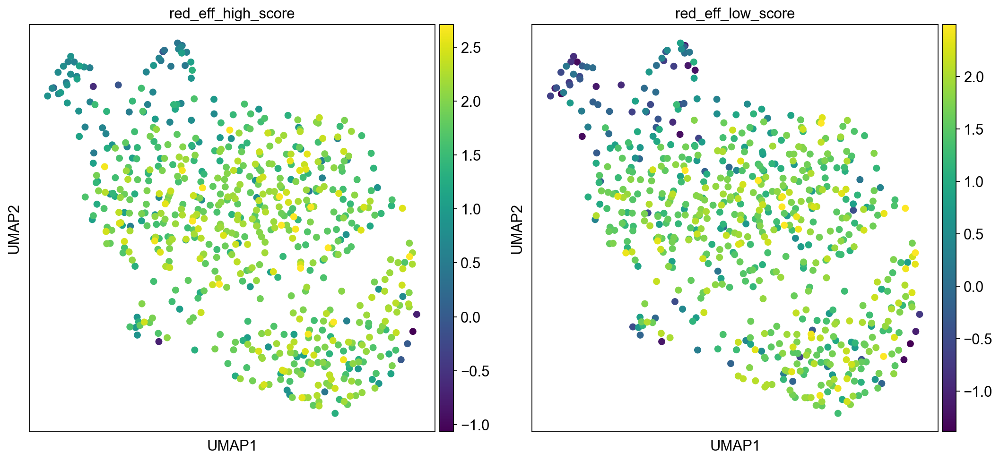

RNA


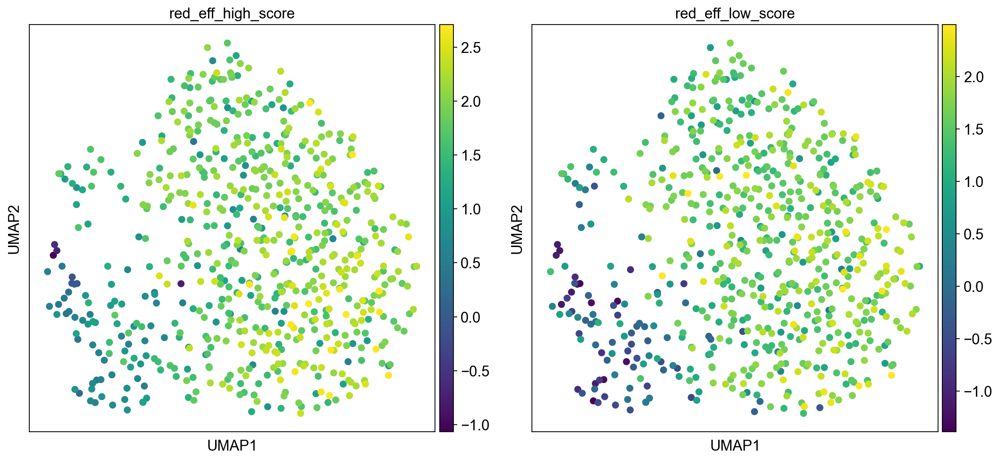

In [83]:
sc.set_figure_params(figsize=(7, 7))

print("Latent")
sc.pl.umap(sample_latent, color = ['red_eff_high_score', 'red_eff_low_score'], vmax="p99", color_map = 'viridis', ncols = 3)
print("Protein")
sc.pl.umap(sample_prot, color = ['red_eff_high_score', 'red_eff_low_score'], vmax="p99", color_map = 'viridis', ncols = 3)
print("RNA")
sc.pl.umap(sample_rna, color = ['red_eff_high_score', 'red_eff_low_score'], vmax="p99", color_map = 'viridis', ncols = 3)


## Precursors

Precursor markers were not measured/were weakly expressed, so no scores were calculated

## All markers

Latent


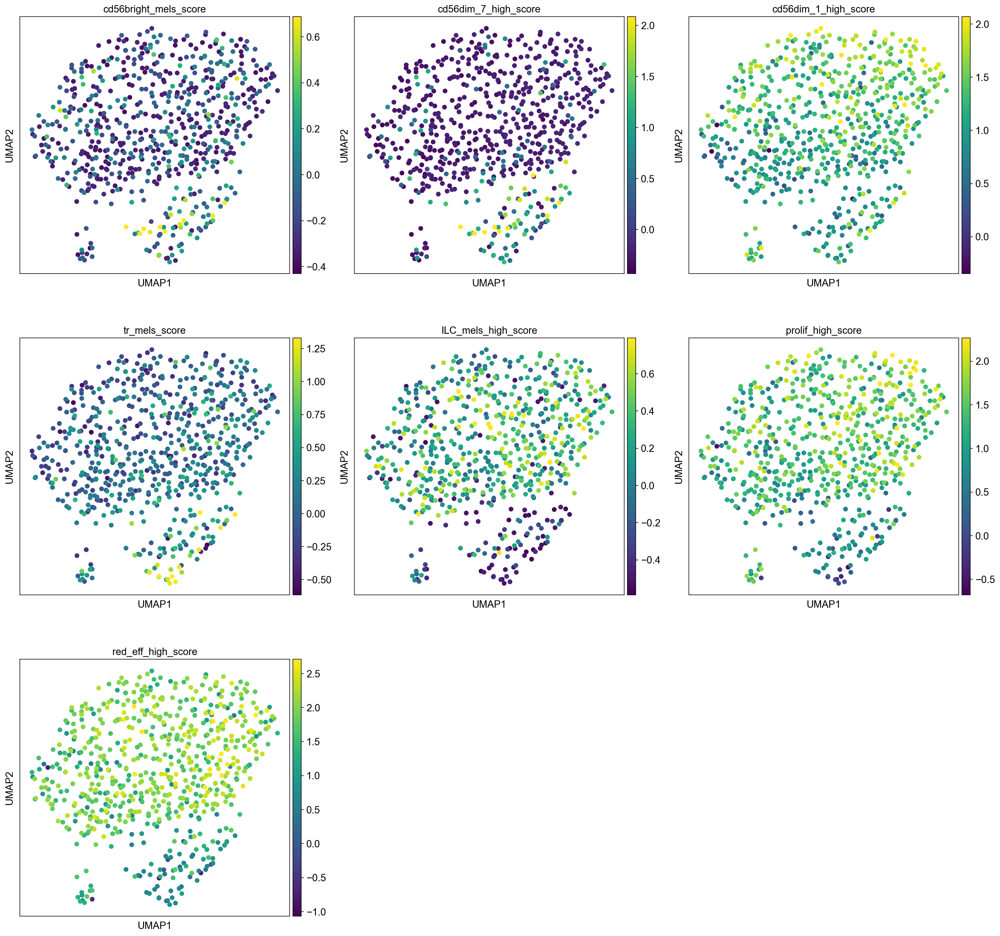

Protein


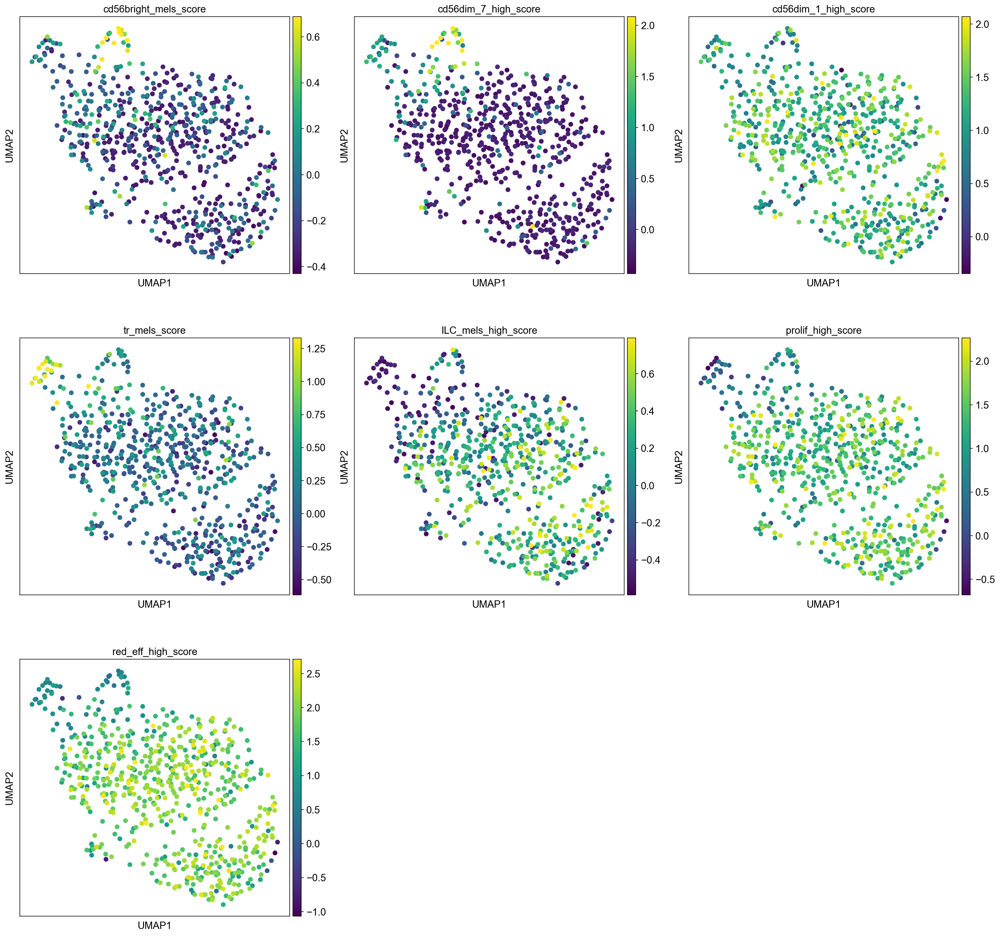

RNA


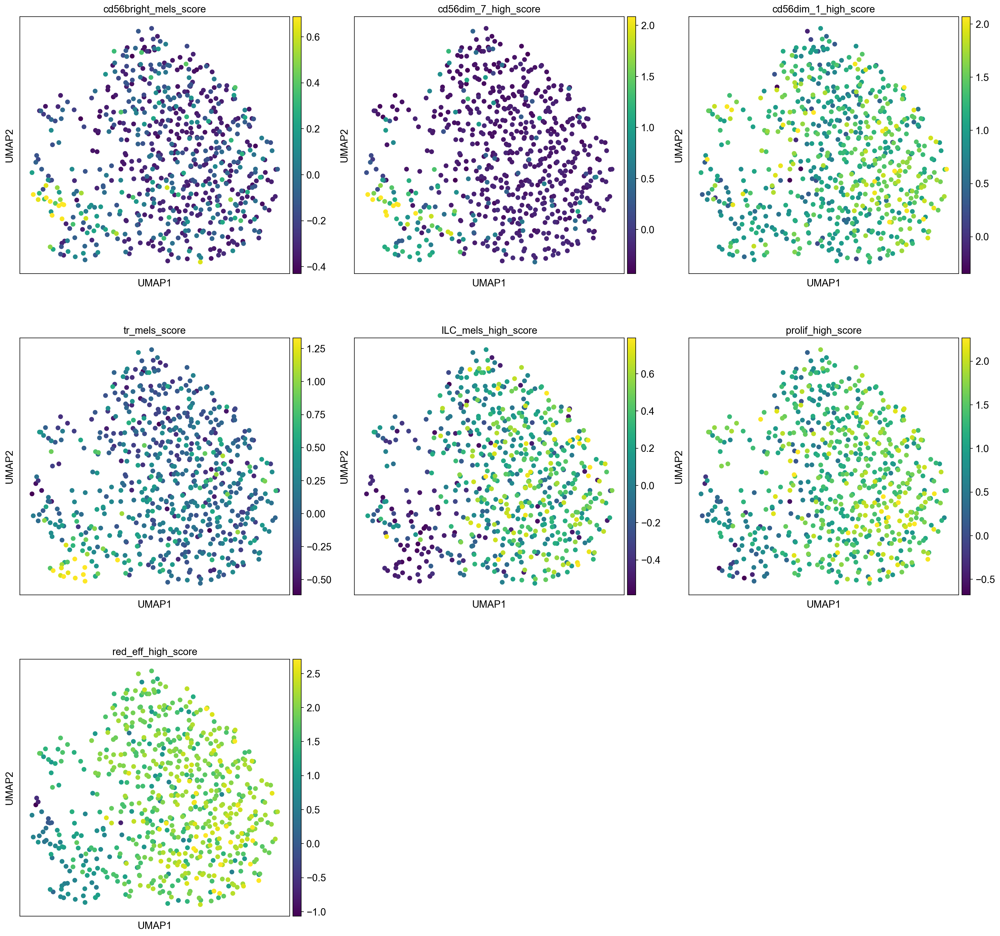

In [84]:

print("Latent")
sc.pl.umap(sample_latent, color = ['cd56bright_mels_score','cd56dim_7_high_score', 'cd56dim_1_high_score', 'tr_mels_score', 'ILC_mels_high_score',  'prolif_high_score', 'red_eff_high_score'], vmax="p99", color_map = 'viridis', ncols = 3)
print("Protein")
sc.pl.umap(sample_prot, color = ['cd56bright_mels_score','cd56dim_7_high_score', 'cd56dim_1_high_score', 'tr_mels_score', 'ILC_mels_high_score',  'prolif_high_score', 'red_eff_high_score'], vmax="p99", color_map = 'viridis', ncols = 3)
print("RNA")
sc.pl.umap(sample_rna, color = ['cd56bright_mels_score','cd56dim_7_high_score', 'cd56dim_1_high_score', 'tr_mels_score', 'ILC_mels_high_score',  'prolif_high_score', 'red_eff_high_score'], vmax="p99", color_map = 'viridis', ncols = 3)





In the study conducted by Melsen et al., clusters identified from their own data, they were able to find also from other datasets only following clusters: NK prolif, CD56dimGZMK-(cluster 1) , CD56dimGZMK+ (cluster 7), CD56bright, ltNK (tissue-resident NK). Markers corresponding these clusters are shown in UMAPs below. 

Latent


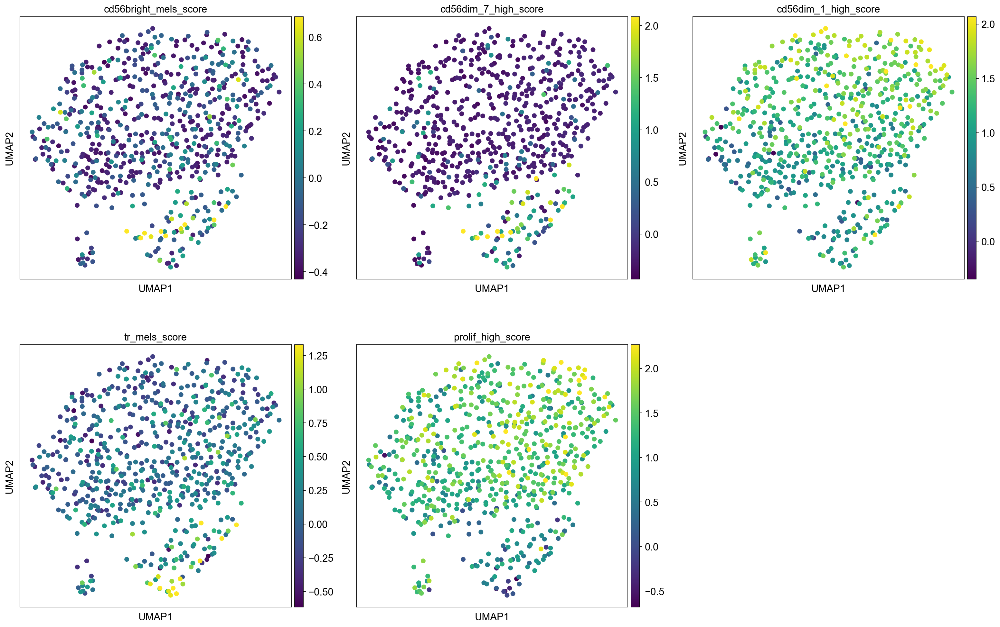

Protein


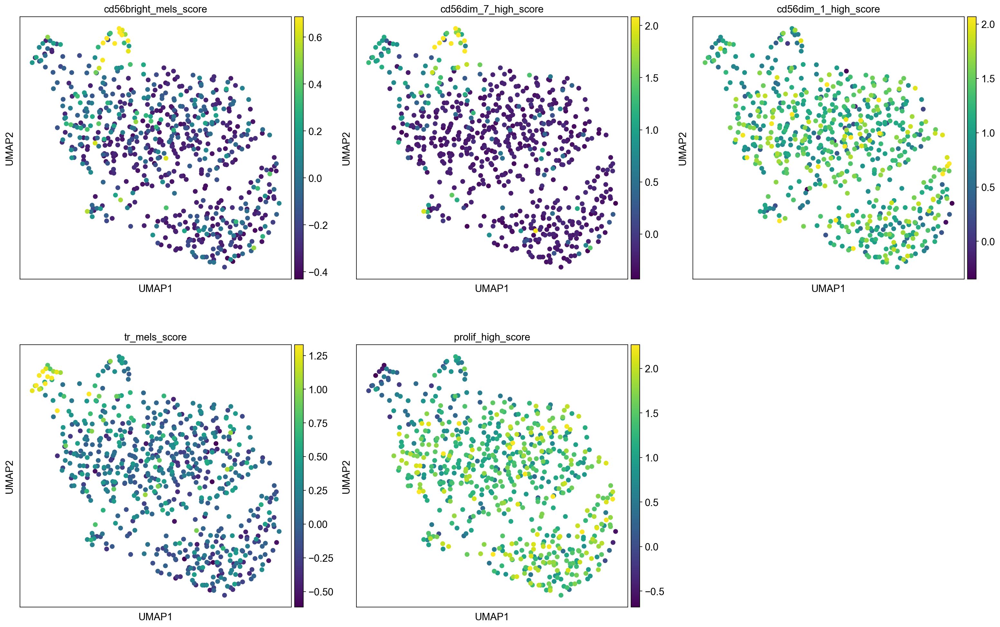

RNA


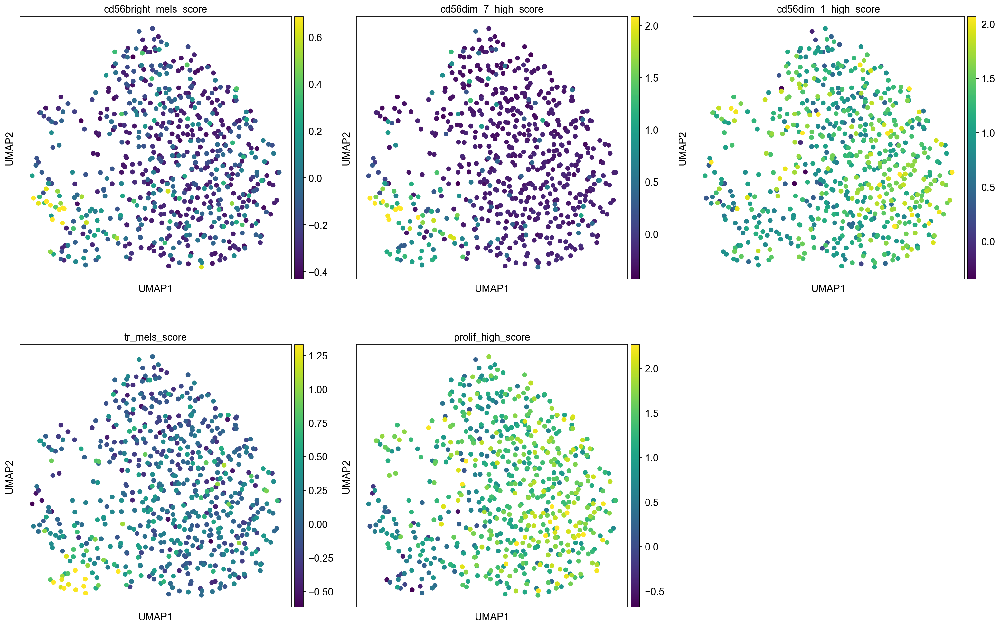

In [85]:

print("Latent")
sc.pl.umap(sample_latent, color = ['cd56bright_mels_score','cd56dim_7_high_score', 'cd56dim_1_high_score', 'tr_mels_score',  'prolif_high_score'], vmax="p99", color_map = 'viridis', ncols = 3)
print("Protein")
sc.pl.umap(sample_prot, color = ['cd56bright_mels_score','cd56dim_7_high_score', 'cd56dim_1_high_score', 'tr_mels_score',  'prolif_high_score'], vmax="p99", color_map = 'viridis', ncols = 3)
print("RNA")
sc.pl.umap(sample_rna, color = ['cd56bright_mels_score','cd56dim_7_high_score', 'cd56dim_1_high_score', 'tr_mels_score',  'prolif_high_score'], vmax="p99", color_map = 'viridis', ncols = 3)


